# AgeGuess Project 
https://www.nature.com/articles/s41597-019-0245-9

In [154]:
#Import libraries
import pandas as pd
from pandas import DataFrame, read_csv   #conda install -c anaconda xlrd
from datetime import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import rcParams
import seaborn as sns
import numpy as np

import numpy as np

#map graphs and geovariables
import geopy
import folium
from folium.plugins import MarkerCluster


#build reports
from pandas_profiling import ProfileReport

#graphs
import os
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

# 1. Import the data

In [4]:
# load the data Ag
df_gamers = pd.read_csv('ag_gamers.csv')
df_guess = pd.read_csv('ag_guess.csv')
df_photos = pd.read_csv('ag_photos.csv')
df_quality = pd.read_csv('ag_quality.csv')
df_report = pd.read_csv('ag_report.csv')

# 2. Undestanding the data - Dataframe information

### 2.1. Number of entires, Variables and Non-null data

In [5]:
df_gamers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4437 entries, 0 to 4436
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   uid            4437 non-null   int64  
 1   g              4437 non-null   int64  
 2   ng             4437 non-null   int64  
 3   points         4437 non-null   int64  
 4   gender         4099 non-null   object 
 5   ethnicity      3917 non-null   object 
 6   birth_country  3914 non-null   object 
 7   birth_year     3910 non-null   float64
 8   created        4437 non-null   object 
 9   access         4437 non-null   object 
dtypes: float64(1), int64(4), object(5)
memory usage: 346.8+ KB


In [6]:
df_guess.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220387 entries, 0 to 220386
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype 
---  ------    --------------   ----- 
 0   uid       220387 non-null  int64 
 1   photo_id  220387 non-null  int64 
 2   guess_id  220387 non-null  int64 
 3   ageG      220387 non-null  int64 
 4   outG      220387 non-null  int64 
 5   access    220387 non-null  object
dtypes: int64(5), object(1)
memory usage: 10.1+ MB


In [7]:
df_photos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4722 entries, 0 to 4721
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   uid            4722 non-null   int64  
 1   photo_id       4722 non-null   int64  
 2   age            4722 non-null   int64  
 3   relation       4722 non-null   object 
 4   gender         4722 non-null   object 
 5   ethnicity      4705 non-null   object 
 6   birth_country  4698 non-null   object 
 7   birth_year     4685 non-null   float64
 8   death_age      12 non-null     float64
 9   created        4722 non-null   object 
dtypes: float64(2), int64(3), object(5)
memory usage: 369.0+ KB


In [8]:
df_quality.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23073 entries, 0 to 23072
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   uid         21407 non-null  float64
 1   photo_id    23073 non-null  int64  
 2   quality_id  23073 non-null  int64  
 3   quality     23073 non-null  int64  
 4   created     21407 non-null  object 
dtypes: float64(1), int64(3), object(1)
memory usage: 901.4+ KB


### 2.2. Index and variables meaning

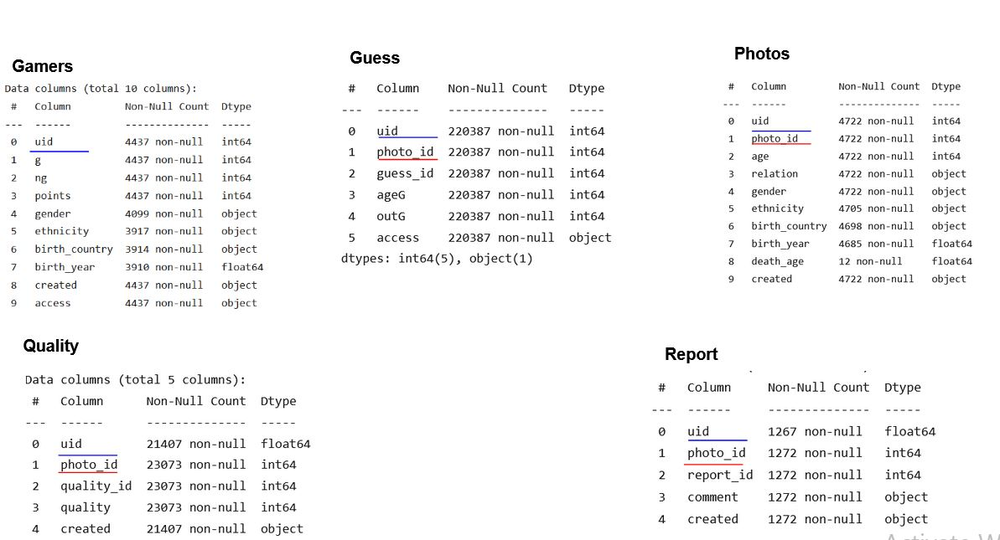

In [9]:
from IPython.display import display, Image
display(Image(filename='Id_connections.JPG'))

#### Gamers Variables 

- (uid) individual identifier of the user 
- (g) number of correct guesses the user made 
- (ng) number of other guesses 
- (points)points gained in the online game
- (gender), (ethnicity), (birth country) and (birth year) is users’ basic demographic information
- (access) when the user last logged 
- (created)  when the user created an account with AgeGuess
- variables store the timestamp in date and time UTC + 1:00 

#### Guess Variables 

- (uid) individual identifiers of the user who made the guess
- (guess_id) the guess itself
- (photo_id) the photograph guessed 
- (ageG) guessed age
- (outG) the deviation in the guess from the real age in years
- (access) date and time UTC + 1:00 in the format ‘YYYY-MM-DD HH:MM:SS’


#### Photos Variables 
- (uid) individual identifiers the user who uploaded the photograph 
- (photo_id variables) Id for  the photograph uploaded.
- (relation) variable indicates whether the photograph is of the user or of another person to which the user has a relation (categories: user, unrelated of friend, mother/father, son/daughter, sibling, half sibling, maternal/paternal grandparent, maternal/paternal aunt/uncle, maternal/paternal cousin, grandchild). 
- (gender),( ethnicity), (birth_country), (birth_year), (death_age) variables contain the respective basic demographic information for the person in the photograph. 
- (created) variable stores the timestamp when the photograph was added in date and time UTC + 1:00 ‘YYYY-MM-DD HH:MM:SS’.

#### Quality Variables 
- (uid), the individual identifier of the user who made the assessment,
- (quality_id) quality assessment
- (photo_id) identifier of the photo on which the assessment was made
- (quality) Quality itself is encoded as 1 = high, 2 = medium, 3 = low 
- (created)  timestamps of the assessment in formats described above 



Exploring some columns

In [10]:
print(pd.isnull(df_gamers).sum())

uid                0
g                  0
ng                 0
points             0
gender           338
ethnicity        520
birth_country    523
birth_year       527
created            0
access             0
dtype: int64


In [11]:
print(pd.isnull(df_guess).sum())

uid         0
photo_id    0
guess_id    0
ageG        0
outG        0
access      0
dtype: int64


In [12]:
df_photos["death_age"].unique()

array([ nan,  92.,  83.,  62., 100.,  79.,  89.,  95.,  61.,  60.])

In [13]:
df_photos.columns

Index(['uid', 'photo_id', 'age', 'relation', 'gender', 'ethnicity',
       'birth_country', 'birth_year', 'death_age', 'created'],
      dtype='object')

### 2.3 Report Gamers, Guess, Photos, Quality

#### -Report Gamers

In [17]:
#Let`s built a fast report as our first exploration data

In [16]:

report_gamers = ProfileReport(df_gamers, title="Guess Report")
report_gamers

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
df_gamers.columns

Index(['uid', 'g', 'ng', 'points', 'gender', 'ethnicity', 'birth_country',
       'birth_year', 'created', 'access'],
      dtype='object')

In [18]:
df_gamers["gender"].unique()

array(['Female', 'Male', nan], dtype=object)

In [19]:
df_gamers["ethnicity"].unique()

array(['Caucasian/White', nan, 'Black', 'Hispanic', 'Other', 'Asian'],
      dtype=object)

In [20]:
df_gamers["birth_country"].unique()
df_gamers.shape

(4437, 10)

##### Coments

- 10 variables 
- variables Categorical 5
- variables numeric 5
- Number of observations	4437
- 'gender', 'ethnicity', 'birth_country','birth_year' have missing data

- birth_country has a high cardinality: 126 distinct values
 


# 3. Exploratory Data + Basic Visualization

## Basic Visualization Gamers 

### Total of gamers 

In [21]:
# Total of gamers
df_gamers["uid"].unique()
total_gamers = df_gamers["uid"].nunique()
print("There are", total_gamers, "gamers in the Citizen Science project AgeGuess")

There are 4437 gamers in the Citizen Science project AgeGuess


### Total of gamers by Gender

In [22]:
# How many gamers are female and male?

gamers_gender = df_gamers["gender"].value_counts().to_frame()
gamers_gender 

,gender
Female,2340
Male,1759


In [60]:
gamers_gender1 = df_gamers.groupby(['gender']).count()


In [48]:
#give index and convert a serie into dataframe
df_gamers_gender= gamers_gender.reset_index()


In [49]:
df_gamers_gender.rename(columns = {"index": "Gender",'gender': "Value" }, inplace=True)
df_gamers_gender

,Gender,Value
0,Female,2340
1,Male,1759


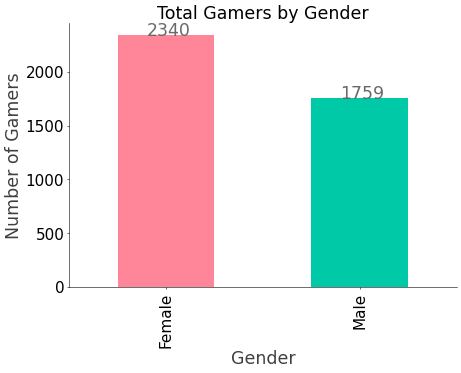

In [59]:
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 50

#Colors to use
colors = ['#ff8599', '#00c9a7']

plot1 = df_gamers["gender"].value_counts().plot(kind='bar', figsize=(10,7),
                                        color= colors, fontsize=22)

plot1.set_alpha(0.8)

# Iterrating over the bars one-by-one 
#Anotate labels
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in plot1.patches:
    totals.append(i.get_height())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in plot1.patches:
    # get_x pulls left or right; get_height pushes up or down
    plot1.text(i.get_x()+.15, i.get_height()-6, \
            str(round((i.get_height()), 2)), fontsize= 25,
                color='dimgrey')

#style
plt.xlabel("Gender", alpha=0.75 , size=25, color= "k" )
plt.ylabel("Number of Gamers", alpha=0.75 , size=25, color= "k" )
plt.title("Total Gamers by Gender", fontsize = 25, color ="k", )
sns.despine(right=True);

plt.show()





Text(0, 0.5, '')

<Figure size 1500x800 with 0 Axes>

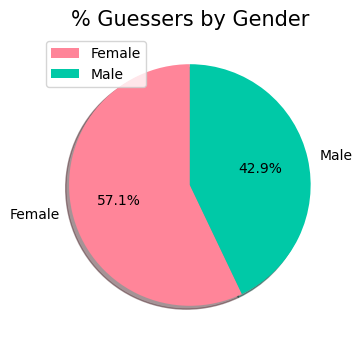

In [65]:
#Pie Gender in gamers
plt.rcParams['figure.dpi'] = 100

plt.figure(figsize = [15,8])
colors = ['#ff8599', '#00c9a7']  #colors = ['#00c9a7', 'lightgreen']

#Plot
ax=df_gamers.groupby(['gender']).count().plot(kind='pie', y='uid', shadow = True, startangle=90, 
autopct=('%1.1f%%'),  colors=colors )

#style
ax.set_title("% Guessers by Gender",  size=15)
ax.tick_params(bottom=False)
ax.set_ylabel(ylabel=None)

### Total of Gamers by ethnicity

In [43]:
# How many ethinicities are?
gamers_ethn = df_gamers["ethnicity"].value_counts().to_frame()
gamers_ethn = gamers_ethn.reset_index()

In [44]:
gamers_ethn.rename(columns = {"index": "Ethnicity",'ethnicity': "Value" }, inplace=True)
gamers_ethn

,Ethnicity,Value
0,Caucasian/White,3025
1,Asian,299
2,Hispanic,265
3,Other,208
4,Black,120


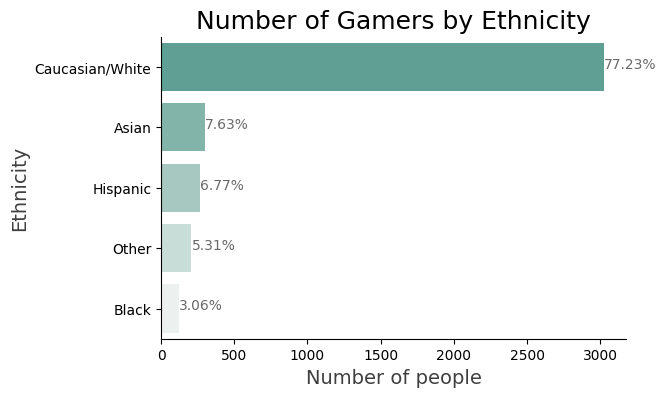

In [31]:
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 100


#plot1
plot2 = sns.barplot(x="Value",y= 'Ethnicity', data= gamers_ethn, ci=None , 
            orient = 'h',palette="light:#5A9",  order= gamers_ethn.sort_values('Value').Ethnicity ) 


# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in plot2.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in plot2.patches:
    # get_width pulls left or right; get_y pushes up or down
    plot2.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=10, color="dimgrey")

# invert for largest on top 
plot2.invert_yaxis()

#style
plt.xlabel("Number of people", alpha=0.75 , size=14, color= "k" )
plt.ylabel("Ethnicity", alpha=0.75 , size=14, color= "k" )
plt.title("Number of Gamers by Ethnicity", fontsize = 18, color ="k", )
sns.despine(right=True);

plt.show()

### Countries where are located the gamers

In [32]:
country_gamers = df_gamers.groupby(['birth_country'])["uid"].count().sort_values(ascending=False).head(10)
country_gamers = country_gamers.reset_index().rename(columns={"uid":'Value'})
country_gamers


,birth_country,Value
0,United States,1663
1,United Kingdom,346
2,Denmark,310
3,Canada,144
4,France,135
5,Mexico,85
6,Italy,82
7,Russia,66
8,Netherlands,64
9,Germany,61


### Top 10 Gamer's Countries

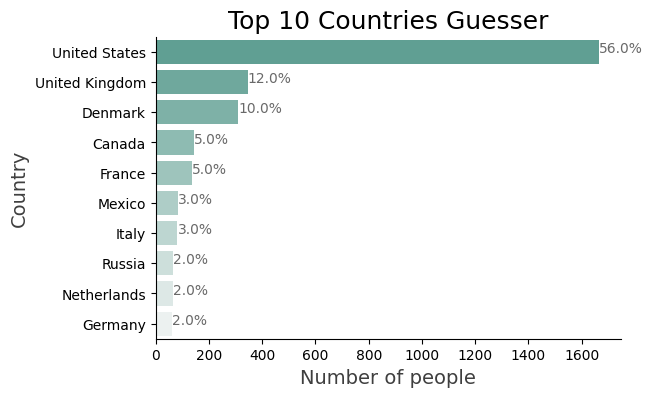

In [33]:
#Stabliching Rules Colors by MaxValue 
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 100


#plot1
plot2 = sns.barplot(x="Value",y= 'birth_country', data= country_gamers, ci=None , 
            orient = 'h',palette="light:#5A9",  order= country_gamers.sort_values('Value').birth_country ) 


#Anotate labels
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in plot2.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in plot2.patches:
    # get_width pulls left or right; get_y pushes up or down
    plot2.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 0))+'%', fontsize=10,color="dimgrey")

# invert for largest on top 
plot2.invert_yaxis()

#style
plt.xlabel("Number of people", alpha=0.75 , size=14, color= "k" )
plt.ylabel("Country", alpha=0.75 , size=14, color= "k" )
plt.title("Top 10 Countries Guesser", fontsize = 18, color ="k", )
sns.despine(right=True);


plt.show()

In [34]:
### featuring -cleaning names contries

In [78]:
gamers_c.columns

Index(['uid', 'g', 'ng', 'points', 'gender', 'ethnicity', 'birth_country',
       'birth_year', 'created', 'access'],
      dtype='object')

In [79]:
#remplacing names of the countries
gamers_c= df_gamers.copy()
gamers_c['birth_country'] = gamers_c['birth_country'].replace(['Per�'],'Peru')
gamers_c['birth_country'] = gamers_c['birth_country'].replace(['Panam�'],'Panama')

In [80]:
#Dataframe all countries
map_gamers = gamers_c.groupby(['birth_country'])["uid"].count().sort_values(ascending=False)
map_gamers = map_gamers.reset_index().rename(columns={"uid":'Value'})
map_gamers.shape

(124, 2)

In [84]:
map_gamers['birth_country'].unique()

array(['United States', 'United Kingdom', 'Denmark', 'Canada', 'France',
       'Mexico', 'Italy', 'Russia', 'Netherlands', 'Germany', 'India',
       'Sweden', 'Belgium', 'Argentina', 'Philippines', 'Spain',
       'Australia', 'Ireland', 'Brazil', 'Colombia', 'Norway', 'Estonia',
       'China', 'Poland', 'Israel', 'New Zealand', 'Chile', 'Finland',
       'Indonesia', 'Malaysia', 'Ukraine', 'Switzerland', 'Venezuela',
       'Peru', 'Austria', 'Portugal', 'Pakistan', 'South Korea', 'Japan',
       'Serbia', 'Iran', 'Greece', 'South Africa', 'Uruguay', 'Oman',
       'Lithuania', 'Kazakhstan', 'Egypt', 'Iceland', 'Czech Republic',
       'Costa Rica', 'Slovakia', 'Turkey', 'Thailand', 'Croatia',
       'Belarus', 'Singapore', 'Hungary', 'Saudi Arabia', 'Hong Kong',
       'Puerto-Rico', 'Bangladesh', 'Georgia', 'Vietnam', 'Bulgaria',
       'Belize', 'United Arab Emirates', 'Jordan', 'Taiwan', 'Latvia',
       'Romania', 'Panama', 'Niger', 'Qatar', 'Guatemala', 'Slovenia',
       'Sr

### Enrich the database: Adding Latitud and Longtitud

https://www.kaggle.com/anand0427/country-details-with-folium

In [86]:
#creating latitud and longitud variables to create the map based on COUNTRIES NAMES

In [87]:

#Need to import geopy
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="Worldmap for gamers AgeGuess")
latitude = []
long = []
for i in map_gamers["birth_country"]:
    if i != None:
        location = geolocator.geocode(i)
        if location!=None:
            latitude.append(location.latitude)#, location.longitude)
            long.append(location.longitude)
        else:
            latitude.append(float("Nan"))#, location.longitude)
            long.append(float("Nan"))
    else:
        latitude.append(float("Nan"))#, location.longitude)
        long.append(float("Nan"))



In [88]:
map_gamers["Latitude"] = latitude
map_gamers.head()

,birth_country,Value,Latitude
0,United States,1663,39.783730
1,United Kingdom,346,54.702354
2,Denmark,310,55.670249
3,Canada,144,61.066692
4,France,135,46.603354


In [89]:
map_gamers["Longitude"] = long
map_gamers

,birth_country,Value,Latitude,Longitude
0,United States,1663,39.783730,-100.445882
1,United Kingdom,346,54.702354,-3.276575
2,Denmark,310,55.670249,10.333328
3,Canada,144,61.066692,-107.991707
4,France,135,46.603354,1.888334
...,...,...,...,...
119,Morocco,1,31.172821,-7.336248
120,Mozambique,1,-19.302233,34.914498
121,Murica,1,46.540337,16.093633
122,Nepal,1,28.108393,84.091714


#### Visualizing Null Values 

In [90]:
map_gamers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   birth_country  124 non-null    object 
 1   Value          124 non-null    int64  
 2   Latitude       121 non-null    float64
 3   Longitude      121 non-null    float64
dtypes: float64(2), int64(1), object(1)
memory usage: 4.0+ KB


In [91]:
null_columns=map_gamers.columns[map_gamers.isnull().any()]
map_gamers[null_columns].isnull().sum()
print(map_gamers[map_gamers.isnull().any(axis=1)].head())

    birth_country  Value  Latitude  Longitude
80   Azerbaidijan      2       NaN        NaN
90        'Straya      1       NaN        NaN
100   Castlevania      1       NaN        NaN


In [92]:
map_gamers.isnull().any()

birth_country    False
Value            False
Latitude          True
Longitude         True
dtype: bool

### FINAL DF: gamer

This data base is ready to merge with the other databse. 4 countries don't have data. 

In [100]:
# Checking Null values

In [93]:
map_gamers1 = map_gamers.dropna(axis=0)

In [96]:
#checking for any NULL values 
map_gamers1.loc[(map_gamers1!=0).any(axis=1)]

,birth_country,Value,Latitude,Longitude
0,United States,1663,39.783730,-100.445882
1,United Kingdom,346,54.702354,-3.276575
2,Denmark,310,55.670249,10.333328
3,Canada,144,61.066692,-107.991707
4,France,135,46.603354,1.888334
...,...,...,...,...
119,Morocco,1,31.172821,-7.336248
120,Mozambique,1,-19.302233,34.914498
121,Murica,1,46.540337,16.093633
122,Nepal,1,28.108393,84.091714


In [97]:
map_gamers1.isnull()

,birth_country,Value,Latitude,Longitude
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
119,False,False,False,False
120,False,False,False,False
121,False,False,False,False
122,False,False,False,False


In [99]:
#IMPORTANT: this line is requisite to display FOLIUM in deepnote****
#Check  https://deepnote.com/publish/9ad481b5-5756-4710-a839-2e129e0d9d94

from IPython.core.display import display, HTML

### Mapping Countries Gamers 

Interactive map with Folium

In [ ]:
#empty map
#this line is requisite to display FOLIUM in deepnote****
def folium_deepnote_show(m):
    data = m.get_root().render()
    data_fixed_height = data.replace('width: 100%;height: 100%', 'width: 100%').replace('height: 100.0%;', 'height: 609px;', 1)
    display(HTML(data_fixed_height))



m= folium.Map(location=[0, 0], TileLayer="cartodbpositron", zoom_start=4)
marker_cluster = MarkerCluster().add_to(m)#for each coordinate, create circlemarker of user percent
for i in range(len(map_gamers1)):
        latitude = map_gamers1.iloc[i]['Latitude']
        longitude = map_gamers1.iloc[i]['Longitude']
        radius=5
        popup_text = """Country : {}<br>
                        %of Users : {}<br>"""
        popup_text = popup_text.format(map_gamers1.iloc[i]['birth_country'],map_gamers1.iloc[i]['Value'])
        folium.CircleMarker(location = (latitude, longitude), radius=radius, popup= popup_text, fill =True).add_to(marker_cluster)#show the map

folium_deepnote_show(m)

#### Cholorpleth - resources to build maps

https://coderzcolumn.com/tutorials/data-science/interactive-maps-choropleth-scattermap-using-folium

https://coderzcolumn.com/tutorials/data-science/plotting-static-maps-with-geopandas-working-with-geospatial-data

In [101]:
import geopandas
#import pandas as pd
#import numpy as np
import matplotlib.pyplot as plt
import warnings


In [105]:
#importing the dataset Geopandas
warnings.filterwarnings('ignore')
%matplotlib inline
geopandas.datasets.available

['naturalearth_cities', 'naturalearth_lowres', 'nybb']

In [107]:
#importing the  dataset from geopandas with geoinformation Lat- Long
world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))
print("Geometry Column Name : ", world.geometry.name)
print("Dataset Size : ", world.shape)
world.head()

Geometry Column Name :  geometry
Dataset Size :  (177, 6)


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


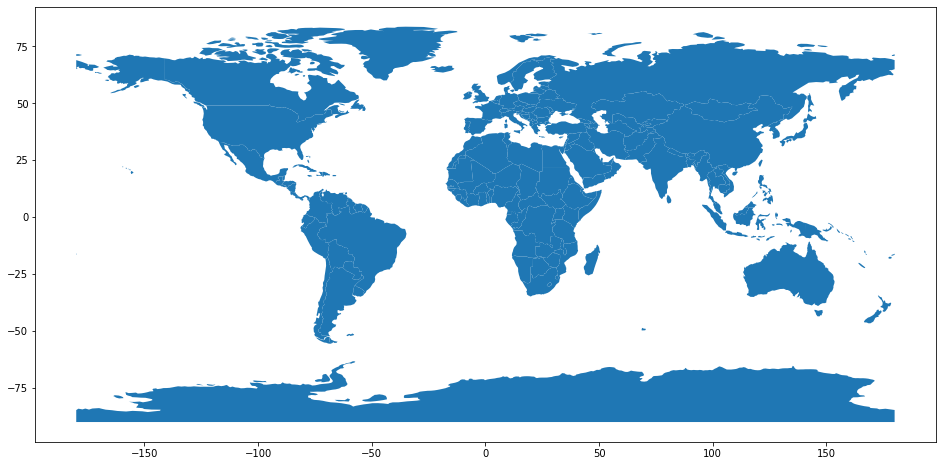

In [109]:
#This is the plot that bring the dataset above! :)
world.plot(figsize=(20,8));

In [110]:
#merge the 2 datasets: geopandas + gamers 
# I recommend to merge first the dataset world and after the pandas dataframe, to expose the geodata, at the contrary doesn't work
world_gamers = world.merge(map_gamers1, how="left", left_on=['name'], right_on=['birth_country'])
print("Type of DataFrame : ", type(world_gamers))
world_gamers

Type of DataFrame :  <class 'geopandas.geodataframe.GeoDataFrame'>


,pop_est,continent,name,iso_a3,gdp_md_est,geometry,birth_country,Value,Latitude,Longitude
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",NaN,NaN,NaN,NaN
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",Tanzania,1.0,-6.524712,35.787844
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",NaN,NaN,NaN,NaN
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",Canada,144.0,61.066692,-107.991707
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
172,7111024,Europe,Serbia,SRB,101800.0,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",Serbia,10.0,44.153412,20.551440
173,642550,Europe,Montenegro,MNE,10610.0,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",NaN,NaN,NaN,NaN
174,1895250,Europe,Kosovo,-99,18490.0,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",NaN,NaN,NaN,NaN
175,1218208,North America,Trinidad and Tobago,TTO,43570.0,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",NaN,NaN,NaN,NaN


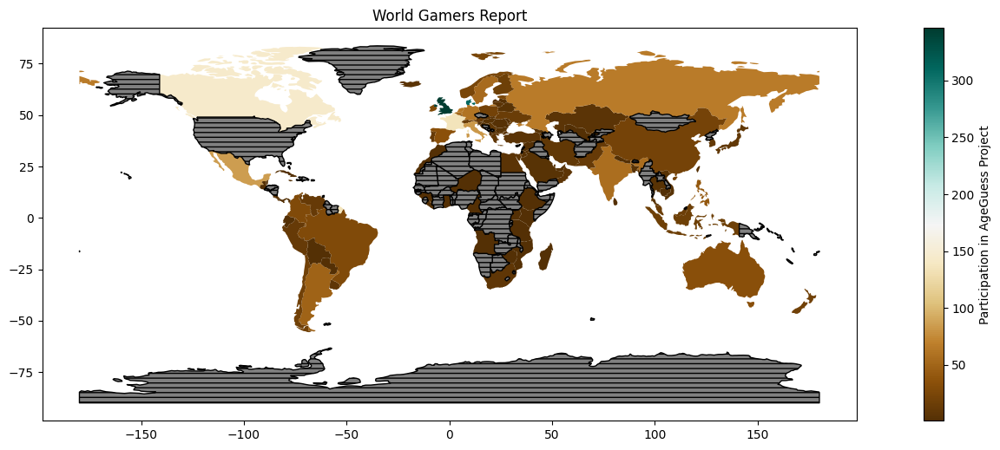

In [111]:
#Cholorplet Gamers of AgeGuess around the world. See the spaces in gray                   
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 100
world_gamers.plot("Value", figsize=(20,6),
                           legend=True,
                           legend_kwds={"label":"Participation in AgeGuess Project"},
                           cmap=plt.cm.BrBG,
                           missing_kwds={
                               "color":"grey",
                               "edgecolor":"black",
                               "hatch":"---",
                               "label":"Missing Values",
                                                     }
                          )

plt.title("World Gamers Report");

### Featuring variables in Gamer df

Change the format: Object to dateformat

In [113]:
df_gamers.columns

Index(['uid', 'g', 'ng', 'points', 'gender', 'ethnicity', 'birth_country',
       'birth_year', 'created', 'access'],
      dtype='object')

In [114]:
#Variables "created", "end_date" need to change from  object to date format        
df_gamers['created'] = pd.to_datetime(df_gamers['created'])
df_gamers['access'] = pd.to_datetime(df_gamers['access'])


In [115]:
df_gamers['birth_year'].unique()


array([1991., 1973., 1974.,   nan, 1979., 1993., 1982., 1983., 1986.,
       1988., 1968., 1975., 1989., 1990., 1947., 1980., 1977., 1987.,
       1976., 1972., 1970., 1971., 1985., 1951., 1978., 1962., 1953.,
       1969., 1984., 1954., 1981., 1961., 1992., 1956., 1964., 1963.,
       1967., 1994., 1955., 1966., 1965., 1998., 1948., 1960., 1995.,
       1996., 2002., 1997., 2000., 2004., 1958., 2013., 2001., 1999.,
       1952., 1959., 1957., 1943., 1945., 1942., 1934., 1946., 2014.,
       1941., 1911., 1950., 1944., 1949., 1915., 1940., 2005., 1924.,
       1892., 1899., 1903., 1893., 1933., 1938., 1895., 1935., 1936.,
       1894., 2003., 1896.])

In [116]:
# Time Variable- to datatime
gamers = df_gamers.copy()

In [117]:
# Extracting year, month, day, hour, and minute. Assign all these date component to new column.
gamers['year'] = gamers['created'].dt.year
gamers['month'] = gamers['created'].dt.month

In [118]:
gamers["year"].unique()

array([2014, 2013, 1970, 2015, 2016, 2017, 2018, 2019])

###  Dataframe gamer with new columns: year, month


### How is the participation of Gamers in time?

In [119]:
# Copy
gamers_rate = gamers.copy()

In [120]:
#index date
gamers_rate= gamers_rate.set_index('created')

In [121]:
gamers_rate.columns

Index(['uid', 'g', 'ng', 'points', 'gender', 'ethnicity', 'birth_country',
       'birth_year', 'access', 'year', 'month'],
      dtype='object')

In [122]:
#creating the dataframe (x, y)
gamers_rate1= gamers_rate.groupby(["year", "month"])[ "uid"].count().to_frame()

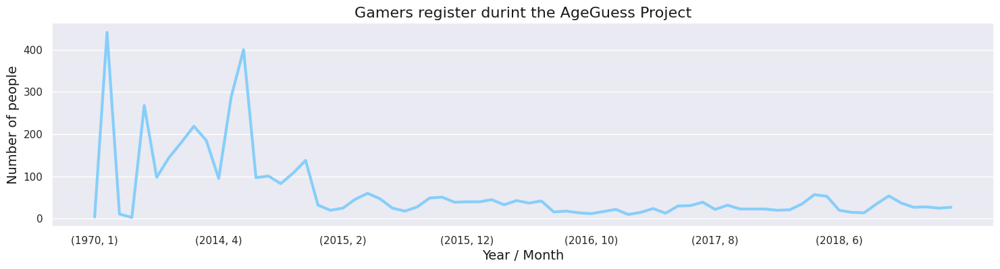

In [123]:
# Total Gamers register during 1970-2019
#sns.set(style="whitegrid")

#plot the increasing of users in the pilot project

plt.figure(figsize = [18,4])
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 360

sns.set(rc={'figure.figsize':(11, 4)})
colors = ['#00c9a7',"#ff8599"]
gamers_rate1['uid'].plot(linewidth=3, color = "lightskyblue");

#style

plt.title("Gamers register durint the AgeGuess Project", fontsize = 16, color ="k")

plt.grid(axis='x', alpha=0.75)
plt.xlabel('Year / Month',fontsize = 14,   color = "k")
plt.ylabel('Number of people', fontsize = 14, color = "k")
ax.invert_yaxis()#show cata from top

# Despine
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(True)


### Is there difference in the participation of female and male Guessing the Age?

In [124]:
# Find the start date
gamers_f = gamers_rate[gamers_rate['gender'] == "Female"].groupby(["year", "month"])["uid"].count().to_frame()
gamers_m = gamers_rate[gamers_rate['gender'] == "Male"].groupby(["year", "month"])["uid"].count().to_frame()

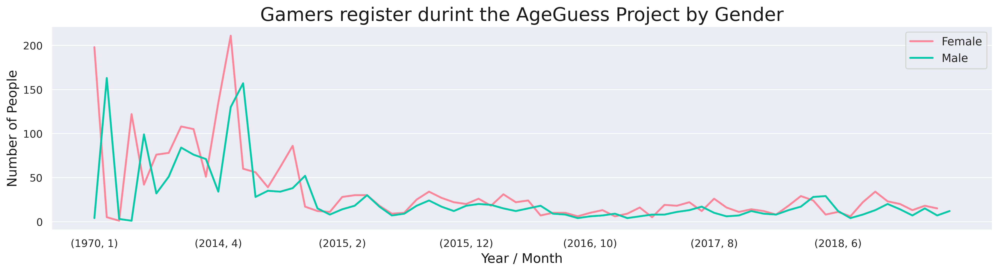

In [125]:
plt.figure(figsize = [18,4])

# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 360

sns.set(rc={'figure.figsize':(11, 4)})
#colors = ['#00c9a7',"#ff8599"]
gamers_f['uid'].plot(linewidth=2, color = '#ff8599', label="Female");
gamers_m['uid'].plot(linewidth=2, color = "#00c9a7", label="Male");


#style

plt.title("Gamers register durint the AgeGuess Project by Gender", fontsize = 20, color ="k")

plt.grid(axis='x', alpha=0.75)
plt.xlabel('Year / Month', fontsize = 14,  color = "k")
plt.ylabel('Number of People', fontsize = 14,  color = "k")
#ax2.invert_yaxis()#show cata from top
plt.legend(fontsize = 12)

# Despine
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(True)


In [126]:
# Copy
gamers_access = gamers.copy()

In [127]:
# Extracting year, month, day, hour, and minute. Assign all these date component to new column.
gamers_access['year_a'] = gamers_access['access'].dt.year
gamers_access['month_a'] = gamers_access['access'].dt.month

In [128]:
gamers_access.columns

Index(['uid', 'g', 'ng', 'points', 'gender', 'ethnicity', 'birth_country',
       'birth_year', 'created', 'year', 'month', 'year_a', 'month_a'],
      dtype='object')

In [131]:
#index date
gamers_access = gamers_access.set_index('access')

KeyError: "None of ['access'] are in the columns"

In [132]:
#creating the dataframe (x, y)

gamers_a_f = gamers_access[gamers_access['gender'] == "Female"].groupby(["year_a", "month_a"])["uid"].count().to_frame()
gamers_a_m = gamers_access[gamers_access['gender'] == "Male"].groupby(["year_a", "month_a"])["uid"].count().to_frame()

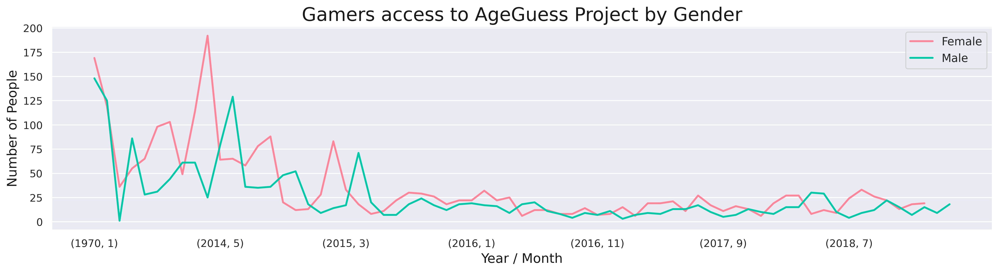

In [133]:
plt.figure(figsize = [18,4])

# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 360

sns.set(rc={'figure.figsize':(11, 4)})
#colors = ['#00c9a7',"#ff8599"]
gamers_a_f['uid'].plot(linewidth=2, color = '#ff8599', label="Female");
gamers_a_m['uid'].plot(linewidth=2, color = "#00c9a7", label="Male");


#style

plt.title("Gamers access to AgeGuess Project by Gender", fontsize = 20, color ="k")

plt.grid(axis='x', alpha=0.75)
plt.xlabel('Year / Month', fontsize = 14,  color = "k")
plt.ylabel('Number of People', fontsize = 14,  color = "k")
#ax2.invert_yaxis()#show cata from top
plt.legend(fontsize = 12)

# Despine
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(True)


Distribution of Agebirth_year -featuring 

In [134]:
gamers.columns

Index(['uid', 'g', 'ng', 'points', 'gender', 'ethnicity', 'birth_country',
       'birth_year', 'created', 'access', 'year', 'month'],
      dtype='object')

In [135]:
gamer= gamers.copy()
gamer.head(2)

,uid,g,ng,points,gender,ethnicity,birth_country,birth_year,created,access,year,month
0,1,212,2906,13523,Female,Caucasian/White,France,1991.0,2014-08-02 16:04:53,2019-03-22 17:40:08,2014,8
1,2,25,206,1353,Male,Caucasian/White,Germany,1973.0,2013-07-24 13:57:51,2014-10-13 17:35:05,2013,7


In [136]:
gamer.birth_year.sort_values()

2762    1892.0
2989    1893.0
3338    1893.0
3586    1894.0
3373    1895.0
         ...  
4289       NaN
4303       NaN
4434       NaN
4435       NaN
4436       NaN
Name: birth_year, Length: 4437, dtype: float64

In [155]:
 #Remover values in column , people born before 1934
 gamer = gamer.drop(gamer[gamer['birth_year']<= 1934.0].index)
 gamer.birth_year.sort_values()

3414    1935.0
3444    1936.0
3108    1938.0
2249    1940.0
1225    1941.0
         ...  
4289       NaN
4303       NaN
4434       NaN
4435       NaN
4436       NaN
Name: birth_year, Length: 4423, dtype: float64

In [158]:
#checking the drop values
year_b_gamer = gamer["birth_year"]
year_b_gamer 

0       1991.0
1       1973.0
2       1974.0
3          NaN
4          NaN
         ...  
4432    2004.0
4433    2005.0
4434       NaN
4435       NaN
4436       NaN
Name: birth_year, Length: 4423, dtype: float64

In [157]:
year_b_gamer.sort_values()

3414    1935.0
3444    1936.0
3108    1938.0
2249    1940.0
1225    1941.0
         ...  
4289       NaN
4303       NaN
4434       NaN
4435       NaN
4436       NaN
Name: birth_year, Length: 4423, dtype: float64

In [141]:
import matplotlib.pyplot as plt

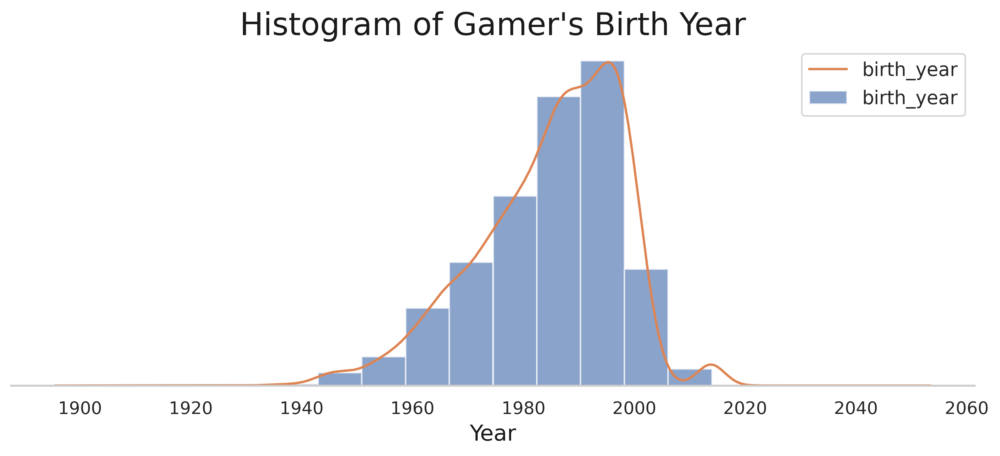

In [146]:
#fig, ax = plt.subplots(figsize = (10,4))
#plt.rcParams['figure.dpi'] = 80

sns.set(style="whitegrid")

plt.style.use("fast")
# Plots #
    # Plot histogram
plot1=year_b_gamer.plot(kind = "hist", density = True, bins = 10, alpha = 0.65 ) # change density to true, because KDE uses density

    # Plot KDE
plot2=year_b_gamer.plot(kind = "kde")

#style

plt.title("Histogram of Gamer's Birth Year", fontsize = 20, color ="k")

plt.grid(axis='x', alpha=0.75)
plt.xlabel('Year', fontsize = 14,  color = "k")
#plt.ylabel('Frecuency', fontsize = 14,  color = "k")
#ax2.invert_yaxis()#show cata from top
plt.legend(fontsize = 12)

plt.ylabel("")
    # Remove y ticks
plt.yticks([])

# Later in the code
plt.grid(False)

# Remove ticks and spines
# Despine
plot1.spines['right'].set_visible(False)
plot1.spines['top'].set_visible(False)
plot1.spines['left'].set_visible(False)
plot1.spines['bottom'].set_visible(True)

    
plt.show()

Kernel Density Estimation in Practice

The free parameters of kernel density estimation are the kernel, which specifies the shape of the distribution placed at each point, and the kernel bandwidth, which controls the size of the kernel at each point. In practice, there are many kernels you might use for a kernel density estimation: in particular, the Scikit-Learn KDE implementation supports one of six kernels, which you can read about in Scikit-Learn's Density Estimation documentation.

FINAL: gamer
This dataframe: the people born before 1924 have been removed
it's required to checked the countries names to match with the geodtabase (letters mistaken or different country name)

### Some exploring visualizations to see the gender, age and gamers 

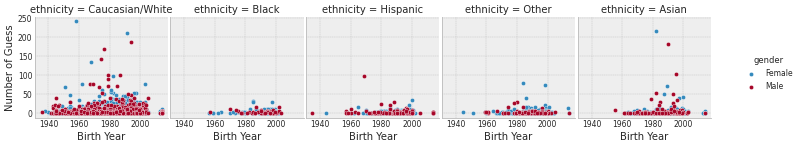

In [169]:
# import seaborn as sb

sns.set()    

sns.set_style("whitegrid") 
#plt.rcParams['figure.dpi'] = 80
plt.style.use("bmh")

g = sns.FacetGrid(gamer, col = "ethnicity",  margin_titles=True, hue = "gender") 

g.map(sns.scatterplot, 'birth_year', "g",)

#plt.title("Ethinicity, Gender and Guessing", fontsize = 20, color ="k")
plt.subplots_adjust(top=0.9)
g.set_axis_labels("Birth Year","Number of Guess")
#g.set_ylabels(self[, label, clear_inner])
g.fig.subplots_adjust(wspace=.02, hspace=.08)
g.add_legend()

plt.show()

It need to built a better graph. This is noisy

## Basic Visualization Guess

In [159]:
# Total of gamers guessing 
df_guess["uid"].unique()


array([   6,    5,    3, ..., 4433, 4432, 4427])

In [160]:
df_guess.columns

Index(['uid', 'photo_id', 'guess_id', 'ageG', 'outG', 'access'], dtype='object')

In [161]:
total_gamers = df_guess["uid"].nunique()
print("There are", total_gamers, "gamers have guess the age in AgeGuess Project")

There are 3644 gamers have guess the age in AgeGuess Project


In [162]:
df_guess["photo_id"].unique()
total_photos_g = df_guess["photo_id"].nunique()
print( total_photos_g , "photos have been used by gamers in AgeGuess Project")

4651 photos have been used by gamers in AgeGuess Project


In [163]:
df_guess["guess_id"].unique()
total_photos_g = df_guess["guess_id"].nunique()
print( total_photos_g , "guesses have been done by gamers in AgeGuess Project")

220387 guesses have been done by gamers in AgeGuess Project


### Report

In [164]:
report_guess = ProfileReport(df_guess, title="Guess Report")
report_guess

Summarize dataset:   0%|          | 0/19 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Featuring to datetime

In [171]:

#Variables "access" need to change from  object to date format        

df_guess['access'] = pd.to_datetime(df_guess['access'])


In [172]:
df_guess.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220387 entries, 0 to 220386
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   uid       220387 non-null  int64         
 1   photo_id  220387 non-null  int64         
 2   guess_id  220387 non-null  int64         
 3   ageG      220387 non-null  int64         
 4   outG      220387 non-null  int64         
 5   access    220387 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(5)
memory usage: 10.1 MB


In [173]:
# distribution of deviation of the AgeGuess 

### FINAL DATAFRAME:  guess 

In [174]:
guess = df_guess.copy()

In [175]:
guess.columns

Index(['uid', 'photo_id', 'guess_id', 'ageG', 'outG', 'access'], dtype='object')

In [179]:
guess["ageG_mean"]=guess["ageG"].mean().round()
guess.head(2)

,uid,photo_id,guess_id,ageG,outG,access,ageG_mean
0,6,243,10,28,2,2012-05-30 03:10:00,29.0
1,5,243,12,26,0,2012-05-30 03:10:00,29.0


In [178]:
guess1 =  guess.groupby(['photo_id']).count()
guess1.head(2)

,uid,guess_id,ageG,outG,access,ageG_mean
photo_id,,,,,,
243,204,204,204,204,204,204
449,100,100,100,100,100,100


In [180]:
guess.info

<bound method DataFrame.info of          uid  photo_id  guess_id  ageG  outG              access  ageG_mean
0          6       243        10    28     2 2012-05-30 03:10:00       29.0
1          5       243        12    26     0 2012-05-30 03:10:00       29.0
2          3       243        37    25    -1 2012-05-30 03:40:00       29.0
3          8       243        50    23    -3 2012-05-30 04:07:00       29.0
4          9       243        67    28     2 2012-05-30 04:23:00       29.0
...      ...       ...       ...   ...   ...                 ...        ...
220382  4432    255075    254911    24    -4 2019-03-22 15:35:14       29.0
220383  3422    255075    254990    26    -2 2019-03-23 16:43:57       29.0
220384  4376    255075    255066    22    -6 2019-03-25 05:58:55       29.0
220385  4427    255075    255085    21    -7 2019-03-25 22:30:51       29.0
220386  4434    255075    255112    19    -9 2019-03-26 18:23:35       29.0

[220387 rows x 7 columns]>

In [181]:
## featuring data 
guess['ageG_mean'].astype(int)


0         29
1         29
2         29
3         29
4         29
          ..
220382    29
220383    29
220384    29
220385    29
220386    29
Name: ageG_mean, Length: 220387, dtype: int64

In [182]:
guess['ageG'].astype(int)

0         28
1         26
2         25
3         23
4         28
          ..
220382    24
220383    26
220384    22
220385    21
220386    19
Name: ageG, Length: 220387, dtype: int64

In [183]:
guess.columns

Index(['uid', 'photo_id', 'guess_id', 'ageG', 'outG', 'access', 'ageG_mean'], dtype='object')

In [185]:
guess.head(2)

,uid,photo_id,guess_id,ageG,outG,access,ageG_mean
0,6,243,10,28,2,2012-05-30 03:10:00,29.0
1,5,243,12,26,0,2012-05-30 03:10:00,29.0


## visualization Photos

### Report Photo


In [188]:
report_photos = ProfileReport(df_photos, title="Photo Report")
report_photos

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

How many pictures of women and men are?

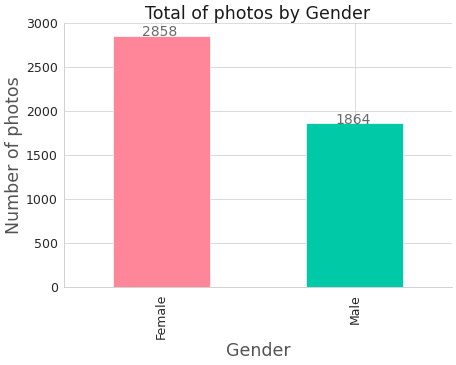

In [193]:
sns.set(style="whitegrid")
#sns.set_color_codes("Spectral"). Use this to change the color set

# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 50
colors = ['#ff8599', '#00c9a7']

#Plot 1
plot1 = df_photos["gender"].value_counts().plot(kind='bar', figsize=(10,7),
                                        color= colors, fontsize=18)
plot1.set_alpha(0.8)
# Iterrating over the bars one-by-one 
#Anotate labels
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in plot1.patches:
    totals.append(i.get_height())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in plot1.patches:
    # get_x pulls left or right; get_height pushes up or down
    plot1.text(i.get_x()+.15, i.get_height()-4, \
            str(round((i.get_height()), 2)), fontsize= 20,
                color='dimgrey')

#style
plt.xlabel("Gender", alpha=0.75 , size=25, color= "k" )
plt.ylabel("Number of photos", alpha=0.75 , size=25, color= "k" )
plt.title("Total of photos by Gender", fontsize = 25, color ="k", )
sns.despine(right=True);

# invert for largest on top. use this line if need to be horizontal
#plot1.invert_xaxis()

plt.show()

Text(0, 0.5, '')

<Figure size 800x1000 with 0 Axes>

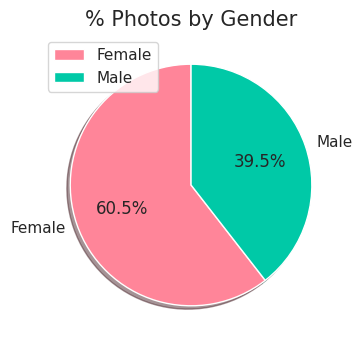

In [192]:
plt.rcParams['figure.dpi'] = 100

plt.figure(figsize = [8,10])
colors = ['#ff8599', '#00c9a7'] #colors = ['#00c9a7', 'lightgreen']

#Plot
ax=df_photos.groupby(['gender']).count().plot(kind='pie', y='uid', shadow = True, startangle=90, 
autopct=('%1.1f%%'),  colors=colors )

#style
ax.set_title("% Photos by Gender",  size=15)
ax.tick_params(bottom=False)
ax.set_ylabel(ylabel=None)

In [194]:
# How many ethinicities are in gamers?

photos_ethn = df_photos["ethnicity"].value_counts().to_frame()
photos_ethn = photos_ethn.reset_index()


In [195]:
photos_ethn.rename(columns = {"index": "Ethnicity",'ethnicity': "Value" }, inplace=True)
photos_ethn

,Ethnicity,Value
0,Caucasian/White,3759
1,Asian,343
2,Hispanic,255
3,Other,245
4,Black,103


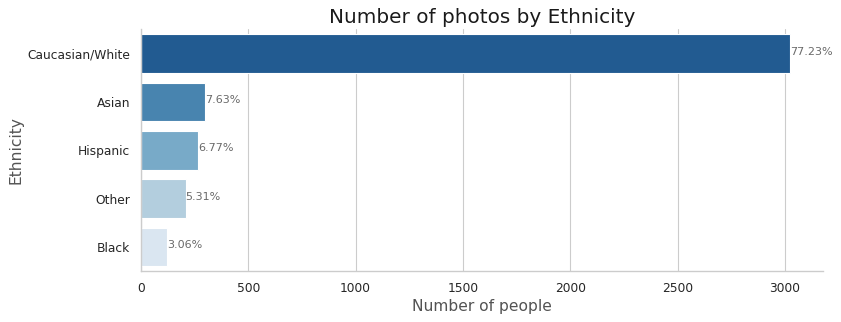

In [197]:
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 80


#plot1
plot2 = sns.barplot(x="Value",y= 'Ethnicity', data= gamers_ethn, ci=None , 
            orient = 'h',palette="Blues",  order= photos_ethn.sort_values('Value').Ethnicity ) 


#Anotate labels
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in plot2.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in plot2.patches:
    # get_width pulls left or right; get_y pushes up or down
    plot2.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 2))+'%', fontsize=10, color="dimgrey")

# invert for largest on top 
plot2.invert_yaxis()

#style
plt.xlabel("Number of people", alpha=0.75 , size=14, color= "k" )
plt.ylabel("Ethnicity", alpha=0.75 , size=14, color= "k" )
plt.title("Number of photos by Ethnicity", fontsize = 18, color ="k", )
sns.despine(right=True);

plt.show()

In [198]:
df_photos.columns

Index(['uid', 'photo_id', 'age', 'relation', 'gender', 'ethnicity',
       'birth_country', 'birth_year', 'death_age', 'created'],
      dtype='object')

In [199]:
#Top countries in the photos 
country_photos = df_photos.groupby(['birth_country'])["photo_id"].count().sort_values(ascending=False).head(10)
country_photos = country_photos.reset_index().rename(columns={"photo_id":'Value'})
country_photos

,birth_country,Value
0,United States,2010
1,United Kingdom,438
2,Denmark,390
3,France,204
4,Canada,179
5,Mexico,86
6,Sweden,85
7,Germany,81
8,Italy,79
9,Brazil,76


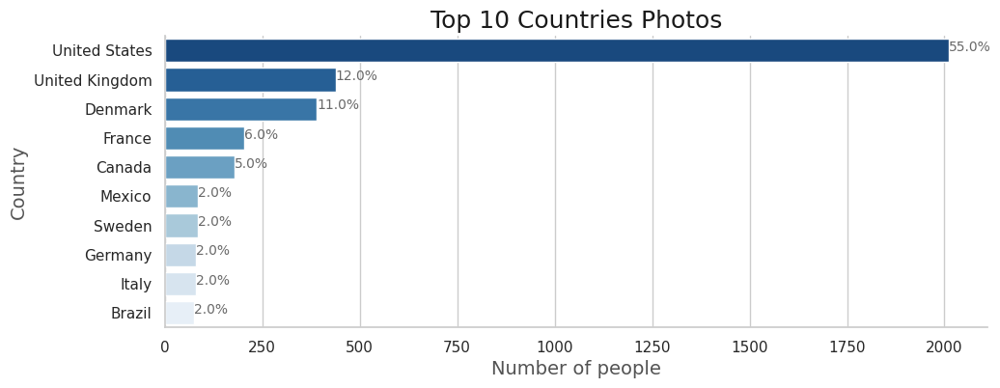

In [200]:
# Increase the sharpness of the display
plt.rcParams['figure.dpi'] = 100


#plot2
plot2 = sns.barplot(x="Value",y= 'birth_country', data= country_photos, ci=None , 
            orient = 'h',palette="Blues",  order= country_photos.sort_values('Value').birth_country ) 


#Anotate labels
# create a list to collect the plt.patches data
totals = []

# find the values and append to list
for i in plot2.patches:
    totals.append(i.get_width())

# set individual bar lables using above list
total = sum(totals)

# set individual bar lables using above list
for i in plot2.patches:
    # get_width pulls left or right; get_y pushes up or down
    plot2.text(i.get_width()+.3, i.get_y()+.38, \
            str(round((i.get_width()/total)*100, 0))+'%', fontsize=10, color="dimgrey")

# invert for largest on top 
plot2.invert_yaxis()

#style
plt.xlabel("Number of people", alpha=0.75 , size=14, color= "k" )
plt.ylabel("Country", alpha=0.75 , size=14, color= "k" )
plt.title("Top 10 Countries Photos", fontsize = 18, color ="k", )
sns.despine(right=True);


plt.show()

## Databse Quality 

In [203]:
report_quality = ProfileReport(df_quality, title="Quality Report")
report_quality



Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Database Reports

In [206]:
report_report = ProfileReport(df_report, title="Report Report")
report_report

Summarize dataset:   0%|          | 0/18 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
In this analysis I don`t use the Quality and Report Database.  

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=f7860d31-a584-4a5b-bb34-631097145929' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>